Accuracy: 0.9732620320855615
               precision    recall  f1-score   support

    Depressed       0.98      0.97      0.97        91
Non Depressed       0.97      0.98      0.97        96

     accuracy                           0.97       187
    macro avg       0.97      0.97      0.97       187
 weighted avg       0.97      0.97      0.97       187



C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


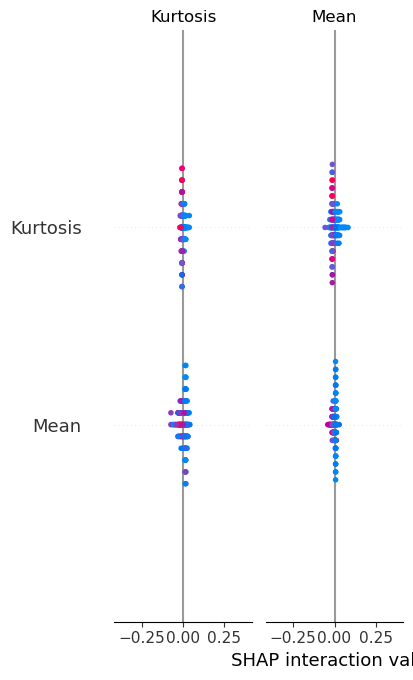

In [10]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define Random Forest model
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# Initialize the explainer with the RandomForest model and training data
explainer = shap.TreeExplainer(model)
# Calculate SHAP values for all samples in the testing data
shap_values = explainer.shap_values(X_test)
# Visualize the explanations
shap.summary_plot(shap_values, X_test)


In [11]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define Random Forest model
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# Initialize the explainer with the RandomForest model and training data
explainer = shap.TreeExplainer(model)
# Calculate SHAP values for all samples in the testing data
shap_values = explainer.shap_values(X_test)
# Visualize the explanations
shap.summary_plot(shap_values, X_test)


ValueError: could not convert string to float: '[4635060.              -0.j         2492277.51680722+1511888.62754465j\n  862007.51438184+1658874.52848704j  343331.36489908  +86148.3165887j\n  620513.27277885 -734594.765895j   1450646.29559227-1239833.99547328j\n 2868000.92804777-1389889.41841757j 2772057.72391447 -208902.92091477j\n 2829203.24761857+1264781.89648675j 1451030.02994253+1350181.78832189j\n -199044.35055155+1050071.54102961j  -78438.2950298 -1065789.76486283j\n 1761916.78535153-2222006.45182368j 3166419.05191224 -718663.74131921j\n 3127135.97948108 +756110.13951235j 1806721.33311408 +880651.28762255j\n 1073988.0244404 +1514002.09764228j  614170.67961165 +674807.54570951j\n  158763.32116331 -830209.94543888j 1500660.        -1408800.j\n 2972101.7915525 -1291579.57699218j 3260965.85603988 +318651.35445164j\n 2764206.97930104+2066231.5160436j   820289.54212915+1595900.52241614j\n -316051.70991104 -217176.24861345j 1140300.65512397-1210155.94060842j\n 2177210.47061572-1406711.53766563j 2426074.59332012 -523487.83980989j\n 3391484.50323155  +34318.82230685j 2486953.57398027+1202017.98293874j\n  943821.84360001+1639880.24884194j   83257.38496151 +224635.41057326j\n  314729.22226841-1645545.92043825j 1689761.29721521-1670453.5919304j\n 3722387.31396077 -962275.494395j   2890483.30742356 +987402.27399548j\n 1778904.86266924+1745495.9893472j   562218.08904259 +471297.25597352j\n  331860.              -0.j          562218.08904259 -471297.25597352j\n 1778904.86266924-1745495.9893472j  2890483.30742356 -987402.27399548j\n 3722387.31396077 +962275.494395j   1689761.29721521+1670453.5919304j\n  314729.22226841+1645545.92043825j   83257.38496151 -224635.41057326j\n  943821.84360001-1639880.24884194j 2486953.57398027-1202017.98293874j\n 3391484.50323155  -34318.82230685j 2426074.59332012 +523487.83980989j\n 2177210.47061572+1406711.53766563j 1140300.65512397+1210155.94060842j\n -316051.70991104 +217176.24861345j  820289.54212915-1595900.52241614j\n 2764206.97930104-2066231.5160436j  3260965.85603988 -318651.35445164j\n 2972101.7915525 +1291579.57699218j 1500660.        +1408800.j\n  158763.32116331 +830209.94543888j  614170.67961165 -674807.54570951j\n 1073988.0244404 -1514002.09764228j 1806721.33311408 -880651.28762255j\n 3127135.97948108 -756110.13951235j 3166419.05191224 +718663.74131921j\n 1761916.78535153+2222006.45182368j  -78438.2950298 +1065789.76486283j\n -199044.35055155-1050071.54102961j 1451030.02994253-1350181.78832189j\n 2829203.24761857-1264781.89648675j 2772057.72391447 +208902.92091477j\n 2868000.92804777+1389889.41841757j 1450646.29559227+1239833.99547328j\n  620513.27277885 +734594.765895j    343331.36489908  -86148.3165887j\n  862007.51438184-1658874.52848704j 2492277.51680722-1511888.62754465j]'

In [12]:
import pandas as pd
import numpy as np  # Added numpy for numeric operations
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Data Preprocessing
# Convert complex number string representation to numeric values
train_data = train_data.apply(lambda x: pd.to_numeric(x, errors='ignore'))
test_data = test_data.apply(lambda x: pd.to_numeric(x, errors='ignore'))

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define Random Forest model
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# Initialize the explainer with the RandomForest model and training data
explainer = shap.TreeExplainer(model)
# Calculate SHAP values for all samples in the testing data
shap_values = explainer.shap_values(X_test)
# Visualize the explanations
shap.summary_plot(shap_values, X_test)


ValueError: could not convert string to float: '[4635060.              -0.j         2492277.51680722+1511888.62754465j\n  862007.51438184+1658874.52848704j  343331.36489908  +86148.3165887j\n  620513.27277885 -734594.765895j   1450646.29559227-1239833.99547328j\n 2868000.92804777-1389889.41841757j 2772057.72391447 -208902.92091477j\n 2829203.24761857+1264781.89648675j 1451030.02994253+1350181.78832189j\n -199044.35055155+1050071.54102961j  -78438.2950298 -1065789.76486283j\n 1761916.78535153-2222006.45182368j 3166419.05191224 -718663.74131921j\n 3127135.97948108 +756110.13951235j 1806721.33311408 +880651.28762255j\n 1073988.0244404 +1514002.09764228j  614170.67961165 +674807.54570951j\n  158763.32116331 -830209.94543888j 1500660.        -1408800.j\n 2972101.7915525 -1291579.57699218j 3260965.85603988 +318651.35445164j\n 2764206.97930104+2066231.5160436j   820289.54212915+1595900.52241614j\n -316051.70991104 -217176.24861345j 1140300.65512397-1210155.94060842j\n 2177210.47061572-1406711.53766563j 2426074.59332012 -523487.83980989j\n 3391484.50323155  +34318.82230685j 2486953.57398027+1202017.98293874j\n  943821.84360001+1639880.24884194j   83257.38496151 +224635.41057326j\n  314729.22226841-1645545.92043825j 1689761.29721521-1670453.5919304j\n 3722387.31396077 -962275.494395j   2890483.30742356 +987402.27399548j\n 1778904.86266924+1745495.9893472j   562218.08904259 +471297.25597352j\n  331860.              -0.j          562218.08904259 -471297.25597352j\n 1778904.86266924-1745495.9893472j  2890483.30742356 -987402.27399548j\n 3722387.31396077 +962275.494395j   1689761.29721521+1670453.5919304j\n  314729.22226841+1645545.92043825j   83257.38496151 -224635.41057326j\n  943821.84360001-1639880.24884194j 2486953.57398027-1202017.98293874j\n 3391484.50323155  -34318.82230685j 2426074.59332012 +523487.83980989j\n 2177210.47061572+1406711.53766563j 1140300.65512397+1210155.94060842j\n -316051.70991104 +217176.24861345j  820289.54212915-1595900.52241614j\n 2764206.97930104-2066231.5160436j  3260965.85603988 -318651.35445164j\n 2972101.7915525 +1291579.57699218j 1500660.        +1408800.j\n  158763.32116331 +830209.94543888j  614170.67961165 -674807.54570951j\n 1073988.0244404 -1514002.09764228j 1806721.33311408 -880651.28762255j\n 3127135.97948108 -756110.13951235j 3166419.05191224 +718663.74131921j\n 1761916.78535153+2222006.45182368j  -78438.2950298 +1065789.76486283j\n -199044.35055155-1050071.54102961j 1451030.02994253-1350181.78832189j\n 2829203.24761857-1264781.89648675j 2772057.72391447 +208902.92091477j\n 2868000.92804777+1389889.41841757j 1450646.29559227+1239833.99547328j\n  620513.27277885 +734594.765895j    343331.36489908  -86148.3165887j\n  862007.51438184-1658874.52848704j 2492277.51680722-1511888.62754465j]'

In [13]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Data Preprocessing
# Extract real part of complex numbers
train_data = train_data.applymap(lambda x: x.real if isinstance(x, complex) else x)
test_data = test_data.applymap(lambda x: x.real if isinstance(x, complex) else x)

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define Random Forest model
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# Initialize the explainer with the RandomForest model and training data
explainer = shap.TreeExplainer(model)
# Calculate SHAP values for all samples in the testing data
shap_values = explainer.shap_values(X_test)
# Visualize the explanations
shap.summary_plot(shap_values, X_test)


ValueError: could not convert string to float: '[4635060.              -0.j         2492277.51680722+1511888.62754465j\n  862007.51438184+1658874.52848704j  343331.36489908  +86148.3165887j\n  620513.27277885 -734594.765895j   1450646.29559227-1239833.99547328j\n 2868000.92804777-1389889.41841757j 2772057.72391447 -208902.92091477j\n 2829203.24761857+1264781.89648675j 1451030.02994253+1350181.78832189j\n -199044.35055155+1050071.54102961j  -78438.2950298 -1065789.76486283j\n 1761916.78535153-2222006.45182368j 3166419.05191224 -718663.74131921j\n 3127135.97948108 +756110.13951235j 1806721.33311408 +880651.28762255j\n 1073988.0244404 +1514002.09764228j  614170.67961165 +674807.54570951j\n  158763.32116331 -830209.94543888j 1500660.        -1408800.j\n 2972101.7915525 -1291579.57699218j 3260965.85603988 +318651.35445164j\n 2764206.97930104+2066231.5160436j   820289.54212915+1595900.52241614j\n -316051.70991104 -217176.24861345j 1140300.65512397-1210155.94060842j\n 2177210.47061572-1406711.53766563j 2426074.59332012 -523487.83980989j\n 3391484.50323155  +34318.82230685j 2486953.57398027+1202017.98293874j\n  943821.84360001+1639880.24884194j   83257.38496151 +224635.41057326j\n  314729.22226841-1645545.92043825j 1689761.29721521-1670453.5919304j\n 3722387.31396077 -962275.494395j   2890483.30742356 +987402.27399548j\n 1778904.86266924+1745495.9893472j   562218.08904259 +471297.25597352j\n  331860.              -0.j          562218.08904259 -471297.25597352j\n 1778904.86266924-1745495.9893472j  2890483.30742356 -987402.27399548j\n 3722387.31396077 +962275.494395j   1689761.29721521+1670453.5919304j\n  314729.22226841+1645545.92043825j   83257.38496151 -224635.41057326j\n  943821.84360001-1639880.24884194j 2486953.57398027-1202017.98293874j\n 3391484.50323155  -34318.82230685j 2426074.59332012 +523487.83980989j\n 2177210.47061572+1406711.53766563j 1140300.65512397+1210155.94060842j\n -316051.70991104 +217176.24861345j  820289.54212915-1595900.52241614j\n 2764206.97930104-2066231.5160436j  3260965.85603988 -318651.35445164j\n 2972101.7915525 +1291579.57699218j 1500660.        +1408800.j\n  158763.32116331 +830209.94543888j  614170.67961165 -674807.54570951j\n 1073988.0244404 -1514002.09764228j 1806721.33311408 -880651.28762255j\n 3127135.97948108 -756110.13951235j 3166419.05191224 +718663.74131921j\n 1761916.78535153+2222006.45182368j  -78438.2950298 +1065789.76486283j\n -199044.35055155-1050071.54102961j 1451030.02994253-1350181.78832189j\n 2829203.24761857-1264781.89648675j 2772057.72391447 +208902.92091477j\n 2868000.92804777+1389889.41841757j 1450646.29559227+1239833.99547328j\n  620513.27277885 +734594.765895j    343331.36489908  -86148.3165887j\n  862007.51438184-1658874.52848704j 2492277.51680722-1511888.62754465j]'

In [14]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Data Preprocessing
# Extract real part of complex numbers
train_data = train_data.applymap(lambda x: x.real if isinstance(x, complex) else x)
test_data = test_data.applymap(lambda x: x.real if isinstance(x, complex) else x)

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define Random Forest model
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# Initialize the explainer with the RandomForest model and training data
explainer = shap.TreeExplainer(model)
# Calculate SHAP values for all samples in the testing data
shap_values = explainer.shap_values(X_test)
# Visualize the explanations
shap.summary_plot(shap_values, X_test)


ValueError: could not convert string to float: '[4635060.              -0.j         2492277.51680722+1511888.62754465j\n  862007.51438184+1658874.52848704j  343331.36489908  +86148.3165887j\n  620513.27277885 -734594.765895j   1450646.29559227-1239833.99547328j\n 2868000.92804777-1389889.41841757j 2772057.72391447 -208902.92091477j\n 2829203.24761857+1264781.89648675j 1451030.02994253+1350181.78832189j\n -199044.35055155+1050071.54102961j  -78438.2950298 -1065789.76486283j\n 1761916.78535153-2222006.45182368j 3166419.05191224 -718663.74131921j\n 3127135.97948108 +756110.13951235j 1806721.33311408 +880651.28762255j\n 1073988.0244404 +1514002.09764228j  614170.67961165 +674807.54570951j\n  158763.32116331 -830209.94543888j 1500660.        -1408800.j\n 2972101.7915525 -1291579.57699218j 3260965.85603988 +318651.35445164j\n 2764206.97930104+2066231.5160436j   820289.54212915+1595900.52241614j\n -316051.70991104 -217176.24861345j 1140300.65512397-1210155.94060842j\n 2177210.47061572-1406711.53766563j 2426074.59332012 -523487.83980989j\n 3391484.50323155  +34318.82230685j 2486953.57398027+1202017.98293874j\n  943821.84360001+1639880.24884194j   83257.38496151 +224635.41057326j\n  314729.22226841-1645545.92043825j 1689761.29721521-1670453.5919304j\n 3722387.31396077 -962275.494395j   2890483.30742356 +987402.27399548j\n 1778904.86266924+1745495.9893472j   562218.08904259 +471297.25597352j\n  331860.              -0.j          562218.08904259 -471297.25597352j\n 1778904.86266924-1745495.9893472j  2890483.30742356 -987402.27399548j\n 3722387.31396077 +962275.494395j   1689761.29721521+1670453.5919304j\n  314729.22226841+1645545.92043825j   83257.38496151 -224635.41057326j\n  943821.84360001-1639880.24884194j 2486953.57398027-1202017.98293874j\n 3391484.50323155  -34318.82230685j 2426074.59332012 +523487.83980989j\n 2177210.47061572+1406711.53766563j 1140300.65512397+1210155.94060842j\n -316051.70991104 +217176.24861345j  820289.54212915-1595900.52241614j\n 2764206.97930104-2066231.5160436j  3260965.85603988 -318651.35445164j\n 2972101.7915525 +1291579.57699218j 1500660.        +1408800.j\n  158763.32116331 +830209.94543888j  614170.67961165 -674807.54570951j\n 1073988.0244404 -1514002.09764228j 1806721.33311408 -880651.28762255j\n 3127135.97948108 -756110.13951235j 3166419.05191224 +718663.74131921j\n 1761916.78535153+2222006.45182368j  -78438.2950298 +1065789.76486283j\n -199044.35055155-1050071.54102961j 1451030.02994253-1350181.78832189j\n 2829203.24761857-1264781.89648675j 2772057.72391447 +208902.92091477j\n 2868000.92804777+1389889.41841757j 1450646.29559227+1239833.99547328j\n  620513.27277885 +734594.765895j    343331.36489908  -86148.3165887j\n  862007.51438184-1658874.52848704j 2492277.51680722-1511888.62754465j]'

In [15]:

This code will display a LIME explanation for the prediction made by the RandomForestClassifier model for a selected sample from the testing data.

Now, let's move on to SHAP:

```python
import shap

# Initialize the SHAP explainer with the RandomForest model and training data
explainer = shap.TreeExplainer(model)

# Calculate SHAP values for all samples in the testing data
shap_values = explainer.shap_values(X_test)

# Visualize the explanations
shap.summary_plot(shap_values, X_test)


SyntaxError: unterminated string literal (detected at line 3) (468747188.py, line 3)

In [16]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from lime.lime_tabular import LimeTabularExplainer
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define Random Forest model
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# LIME explanation
explainer = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=label_encoder.classes_)
exp = explainer.explain_instance(X_test.values[0], model.predict_proba, num_features=len(X_train.columns))
exp.show_in_notebook(show_table=True)

# SHAP explanation
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, plot_type="bar")


ModuleNotFoundError: No module named 'lime'

In [18]:
!pip install lime


     ---------------------------------------- 0.0/275.7 kB ? eta -:--:--
     - -------------------------------------- 10.2/275.7 kB ? eta -:--:--
     -- ---------------------------------- 20.5/275.7 kB 129.6 kB/s eta 0:00:02
     -- ---------------------------------- 20.5/275.7 kB 129.6 kB/s eta 0:00:02
     -- ---------------------------------- 20.5/275.7 kB 129.6 kB/s eta 0:00:02
     -- ---------------------------------- 20.5/275.7 kB 129.6 kB/s eta 0:00:02
     ---- --------------------------------- 30.7/275.7 kB 77.0 kB/s eta 0:00:04
     ----- -------------------------------- 41.0/275.7 kB 98.1 kB/s eta 0:00:03
     ----- -------------------------------- 41.0/275.7 kB 98.1 kB/s eta 0:00:03
     ----- -------------------------------- 41.0/275.7 kB 98.1 kB/s eta 0:00:03
     -------- ---------------------------- 61.4/275.7 kB 116.9 kB/s eta 0:00:02
     ------------- ---------------------- 102.4/275.7 kB 190.0 kB/s eta 0:00:01
     ----------------- ------------------ 133.1/275.7

Accuracy: 0.9679144385026738
               precision    recall  f1-score   support

    Depressed       0.98      0.96      0.97        91
Non Depressed       0.96      0.98      0.97        96

     accuracy                           0.97       187
    macro avg       0.97      0.97      0.97       187
 weighted avg       0.97      0.97      0.97       187



C:\Users\Hp\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


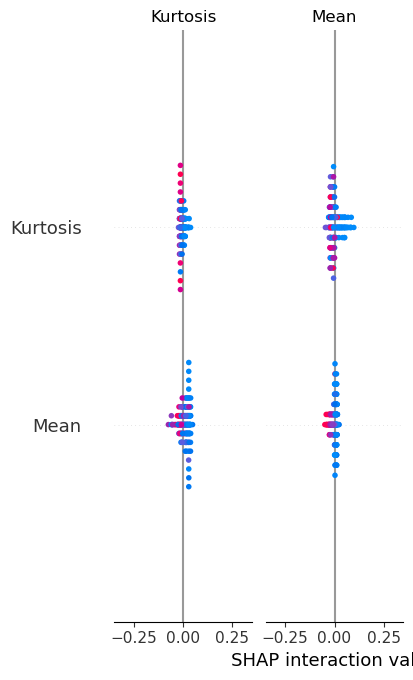

In [1]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from lime.lime_tabular import LimeTabularExplainer
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define Random Forest model
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# LIME explanation
explainer = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=label_encoder.classes_)
exp = explainer.explain_instance(X_test.values[0], model.predict_proba, num_features=len(X_train.columns))
exp.show_in_notebook(show_table=True)

# SHAP explanation
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, plot_type="bar")


In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import InceptionV3
from keras.models import Sequential
from keras.layers import GlobalAveragePooling2D, Dense, Dropout
from keras.optimizers import Adam
from yellowbrick.classifier import ClassBalance
from yellowbrick.model_selection import LearningCurve

# New dataset path
dataset_path = r'D:\demo code'

def count_images_in_folders(path):
    folders = os.listdir(path)
    for folder in folders:
        folder_path = os.path.join(path, folder)
        if os.path.isdir(folder_path):
            images = os.listdir(folder_path)
            print(f'Folder: {folder}, Total Images: {len(images)}')

count_images_in_folders(dataset_path)

num_classes = len(os.listdir(dataset_path))

train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    dataset_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

val_generator = train_datagen.flow_from_directory(
    dataset_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

test_generator = test_datagen.flow_from_directory(
    dataset_path,
    target_size=(224, 224),
    batch_size=1,
    class_mode=None,
    shuffle=False
)

base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

model.compile(optimizer=Adam(lr=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_generator, epochs=40, validation_data=val_generator)

model.summary()

train_loss, train_acc = model.evaluate(train_generator)
val_loss, val_acc = model.evaluate(val_generator)
print(f'Training Accuracy: {train_acc}, Validation Accuracy: {val_acc}')

# Plotting Loss Curve using Yellowbrick
fig, ax = plt.subplots(figsize=(8, 6))
lc_viz = LearningCurve(model, ax=ax, scoring='accuracy')
lc_viz.fit(train_generator, val_generator)
lc_viz.poof()

test_generator.reset()
predictions = model.predict(test_generator, steps=len(test_generator), verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

correct_predictions = np.sum(predicted_classes == true_classes)
total_samples = len(true_classes)
test_accuracy = correct_predictions / total_samples
print(f'Test Accuracy: {test_accuracy}')

# Plotting Class Balance (Accuracy Graph) using Yellowbrick
fig, ax = plt.subplots(figsize=(8, 6))
cb_viz = ClassBalance(labels=class_labels, ax=ax)
cb_viz.fit(true_classes, predicted_classes)
cb_viz.poof()


Accuracy: 0.9786096256684492
               precision    recall  f1-score   support

    Depressed       0.98      0.98      0.98        91
Non Depressed       0.98      0.98      0.98        96

     accuracy                           0.98       187
    macro avg       0.98      0.98      0.98       187
 weighted avg       0.98      0.98      0.98       187



C:\Users\Hp\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


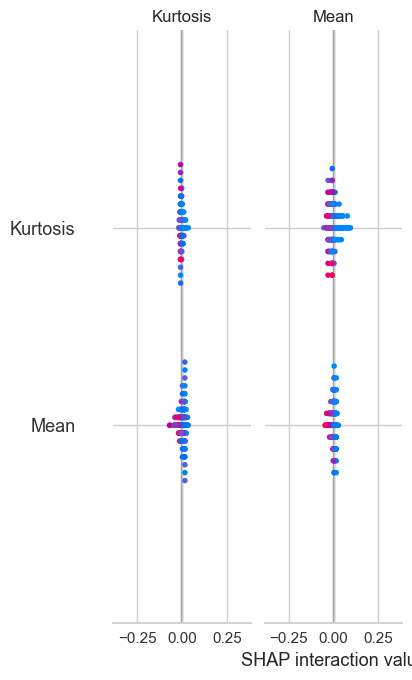

In [4]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from lime.lime_tabular import LimeTabularExplainer
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define Random Forest model
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# LIME explanation
explainer = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=label_encoder.classes_)
exp = explainer.explain_instance(X_test.values[0], model.predict_proba, num_features=len(X_train.columns))
exp.show_in_notebook(show_table=True)

# SHAP explanation
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, plot_type="dot")  # Change plot_type to "dot"


Accuracy: 0.9625668449197861
               precision    recall  f1-score   support

    Depressed       0.97      0.96      0.96        91
Non Depressed       0.96      0.97      0.96        96

     accuracy                           0.96       187
    macro avg       0.96      0.96      0.96       187
 weighted avg       0.96      0.96      0.96       187



C:\Users\Hp\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


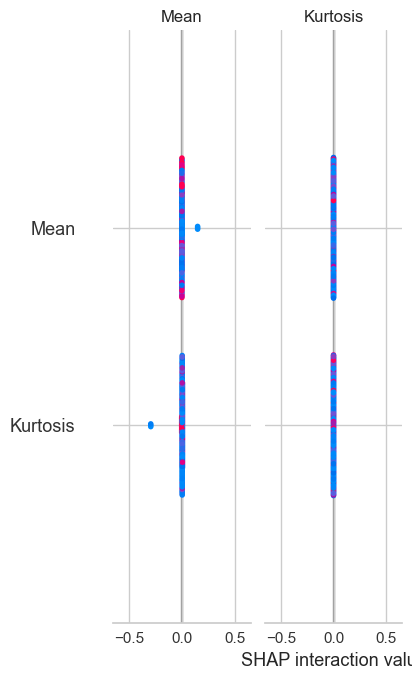

In [5]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from lime.lime_tabular import LimeTabularExplainer
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define RandomForestClassifier model
rf_model = RandomForestClassifier()

# Train the RandomForestClassifier model
rf_model.fit(X_train, y_train_encoded)

# Define DecisionTreeClassifier model (for SHAP explainer)
dt_model = DecisionTreeClassifier()

# Train the DecisionTreeClassifier model (for SHAP explainer)
dt_model.fit(X_train, y_train_encoded)

# Make predictions on the testing data using RandomForestClassifier
y_pred_encoded = rf_model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# LIME explanation
explainer = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=label_encoder.classes_)
exp = explainer.explain_instance(X_test.values[0], rf_model.predict_proba, num_features=len(X_train.columns))
exp.show_in_notebook(show_table=True)

# SHAP explanation using DecisionTreeClassifier
shap_explainer = shap.TreeExplainer(dt_model)
shap_values = shap_explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)


Accuracy: 0.9786096256684492
               precision    recall  f1-score   support

    Depressed       0.97      0.99      0.98        91
Non Depressed       0.99      0.97      0.98        96

     accuracy                           0.98       187
    macro avg       0.98      0.98      0.98       187
 weighted avg       0.98      0.98      0.98       187



C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


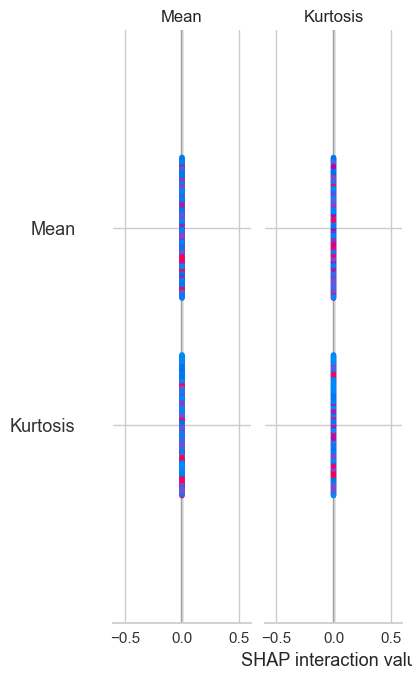

In [6]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define DecisionTreeClassifier model
dt_model = DecisionTreeClassifier()

# Train the DecisionTreeClassifier model
dt_model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = dt_model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# SHAP explanation using DecisionTreeClassifier
shap_explainer = shap.TreeExplainer(dt_model)
shap_values = shap_explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)


In [7]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from lime.lime_tabular import LimeTabularExplainer

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define DecisionTreeClassifier model
dt_model = DecisionTreeClassifier()

# Train the DecisionTreeClassifier model
dt_model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = dt_model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# LIME explanation
explainer = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=label_encoder.classes_)
exp = explainer.explain_instance(X_test.values[0], dt_model.predict_proba, num_features=len(X_train.columns))
exp.show_in_notebook(show_table=True)


Accuracy: 0.9786096256684492
               precision    recall  f1-score   support

    Depressed       0.97      0.99      0.98        91
Non Depressed       0.99      0.97      0.98        96

     accuracy                           0.98       187
    macro avg       0.98      0.98      0.98       187
 weighted avg       0.98      0.98      0.98       187



C:\Users\Hp\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [8]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from lime.lime_tabular import LimeTabularExplainer

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define RandomForestClassifier model
rf_model = RandomForestClassifier()

# Train the RandomForestClassifier model
rf_model.fit(X_train, y_train_encoded)

# Make predictions on the testing data using RandomForestClassifier
y_pred_encoded = rf_model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# LIME explanation
explainer = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=label_encoder.classes_)
exp = explainer.explain_instance(X_test.values[0], rf_model.predict_proba, num_features=len(X_train.columns))
exp.show_in_notebook(show_table=True)


Accuracy: 0.9732620320855615
               precision    recall  f1-score   support

    Depressed       0.98      0.97      0.97        91
Non Depressed       0.97      0.98      0.97        96

     accuracy                           0.97       187
    macro avg       0.97      0.97      0.97       187
 weighted avg       0.97      0.97      0.97       187



C:\Users\Hp\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Accuracy: 0.983957219251337
               precision    recall  f1-score   support

    Depressed       0.98      0.99      0.98        91
Non Depressed       0.99      0.98      0.98        96

     accuracy                           0.98       187
    macro avg       0.98      0.98      0.98       187
 weighted avg       0.98      0.98      0.98       187



C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


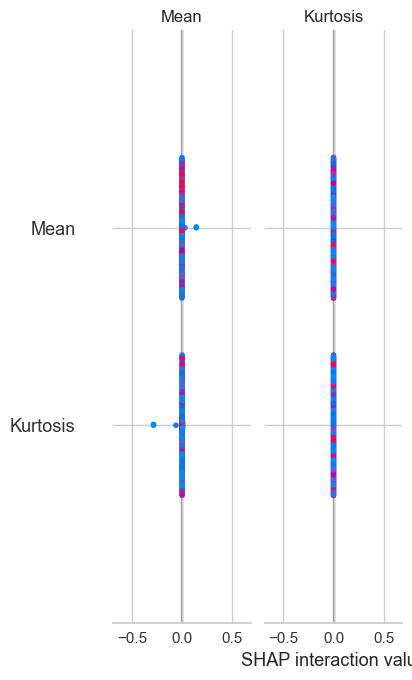

In [9]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define DecisionTreeClassifier model
dt_model = DecisionTreeClassifier()

# Train the DecisionTreeClassifier model
dt_model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = dt_model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# SHAP explanation using DecisionTreeClassifier
shap_explainer = shap.TreeExplainer(dt_model)
shap_values = shap_explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)


Accuracy: 0.983957219251337
               precision    recall  f1-score   support

    Depressed       0.98      0.99      0.98        91
Non Depressed       0.99      0.98      0.98        96

     accuracy                           0.98       187
    macro avg       0.98      0.98      0.98       187
 weighted avg       0.98      0.98      0.98       187



C:\Users\Hp\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


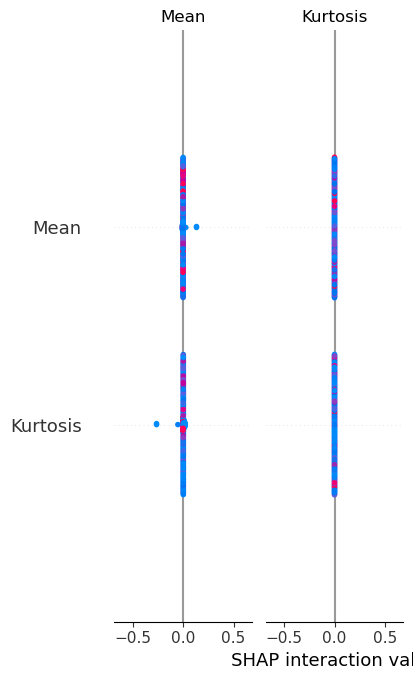

In [1]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from lime.lime_tabular import LimeTabularExplainer
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define DecisionTreeClassifier model
dt_model = DecisionTreeClassifier()

# Train the DecisionTreeClassifier model
dt_model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = dt_model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# LIME explanation
explainer_lime = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=label_encoder.classes_)
exp_lime = explainer_lime.explain_instance(X_test.values[0], dt_model.predict_proba, num_features=len(X_train.columns))
exp_lime.show_in_notebook(show_table=True)

# SHAP explanation
shap_explainer = shap.TreeExplainer(dt_model)
shap_values = shap_explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)


Accuracy: 0.9679144385026738
               precision    recall  f1-score   support

    Depressed       0.95      0.99      0.97        91
Non Depressed       0.99      0.95      0.97        96

     accuracy                           0.97       187
    macro avg       0.97      0.97      0.97       187
 weighted avg       0.97      0.97      0.97       187



C:\Users\Hp\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


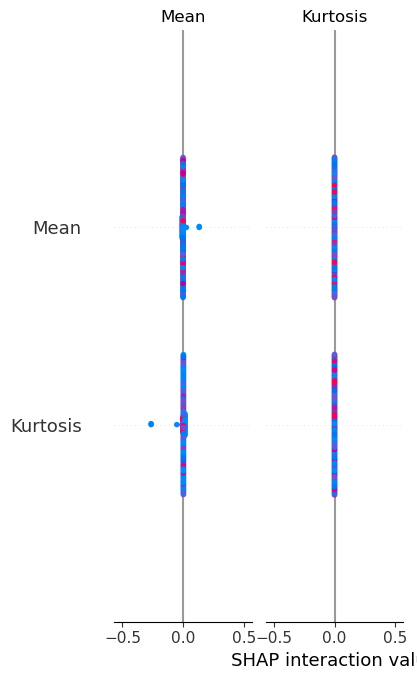

In [1]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from lime.lime_tabular import LimeTabularExplainer
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define DecisionTreeClassifier model
dt_model = DecisionTreeClassifier()

# Train the DecisionTreeClassifier model
dt_model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = dt_model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# LIME explanation
explainer_lime = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=label_encoder.classes_)
exp_lime = explainer_lime.explain_instance(X_test.values[0], dt_model.predict_proba, num_features=len(X_train.columns))
exp_lime.show_in_notebook(show_table=True)

# SHAP explanation
shap_explainer = shap.TreeExplainer(dt_model)
shap_values = shap_explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)


Accuracy: 0.983957219251337
               precision    recall  f1-score   support

    Depressed       0.98      0.99      0.98        91
Non Depressed       0.99      0.98      0.98        96

     accuracy                           0.98       187
    macro avg       0.98      0.98      0.98       187
 weighted avg       0.98      0.98      0.98       187



C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


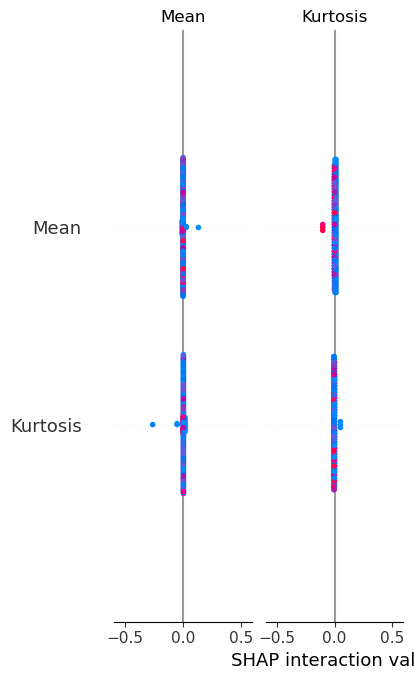

In [2]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define DecisionTreeClassifier model
dt_model = DecisionTreeClassifier()

# Train the DecisionTreeClassifier model
dt_model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = dt_model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# SHAP explanation using DecisionTreeClassifier
shap_explainer = shap.TreeExplainer(dt_model)
shap_values = shap_explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, plot_type="bar")


In [14]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import eli5

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define DecisionTreeClassifier model
dt_model = DecisionTreeClassifier()

# Train the DecisionTreeClassifier model
dt_model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = dt_model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# Explain feature importances using eli5
eli5.show_weights(dt_model, feature_names=list(X_train.columns))


ImportError: cannot import name 'if_delegate_has_method' from 'sklearn.utils.metaestimators' (C:\Users\Hp\anaconda3\Lib\site-packages\sklearn\utils\metaestimators.py)

In [11]:
pip install eli5


     ---------------------------------------- 0.0/216.2 kB ? eta -:--:--
     - -------------------------------------- 10.2/216.2 kB ? eta -:--:--
     - -------------------------------------- 10.2/216.2 kB ? eta -:--:--
     ------- ----------------------------- 41.0/216.2 kB 245.8 kB/s eta 0:00:01
     ---------- -------------------------- 61.4/216.2 kB 328.2 kB/s eta 0:00:01
     --------------- --------------------- 92.2/216.2 kB 375.8 kB/s eta 0:00:01
     --------------------------- -------- 163.8/216.2 kB 614.4 kB/s eta 0:00:01
     -----------------------------------  215.0/216.2 kB 656.4 kB/s eta 0:00:01
     ------------------------------------ 216.2/216.2 kB 628.0 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Obtaining dependency information for graphviz from https://files.pythonhosted.org/packages/00/be/d59db2d1d52697c6adc9eacaf50e8965b6345cc143f671e1ed068818d5cf/graphviz-0.20.3-py3-none-any.whl.met

In [13]:
pip install --upgrade eli5 scikit-learn


Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: eli5 in c:\users\hp\anaconda3\lib\site-packages (0.13.0)
  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/79/3d/02d5d3ed359498fec3abdf65407d3c07e3b8765af17464969055aaec5171/scikit_learn-1.4.2-cp311-cp311-win_amd64.whl.metadata
   ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/10.6 MB 325.1 kB/s eta 0:00:33
   ---------------------------------------- 0.1/10.6 MB 326.1 kB/s eta 0:00:33
   ---------------------------------------- 0.1/10.6 MB 435.7 kB/s eta 0:00:25
    --------------------------------------- 0.1/10.6 MB 566.5 kB/s eta 0:00:19
    -----------------------------

In [17]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define DecisionTreeClassifier model
dt_model = DecisionTreeClassifier()

# Train the DecisionTreeClassifier model
dt_model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = dt_model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# SHAP explanation using DecisionTreeClassifier
shap_explainer = shap.TreeExplainer(dt_model)
shap_values = shap_explainer.shap_values(X_test)

# Display SHAP values for each individual instance and each feature
for i in range(len(X_test)):
    shap.force_plot(shap_explainer.expected_value[0], shap_values[i], X_test.iloc[i])


Accuracy: 0.9732620320855615
               precision    recall  f1-score   support

    Depressed       0.96      0.99      0.97        91
Non Depressed       0.99      0.96      0.97        96

     accuracy                           0.97       187
    macro avg       0.97      0.97      0.97       187
 weighted avg       0.97      0.97      0.97       187



DimensionError: Length of features is not equal to the length of shap_values!

C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


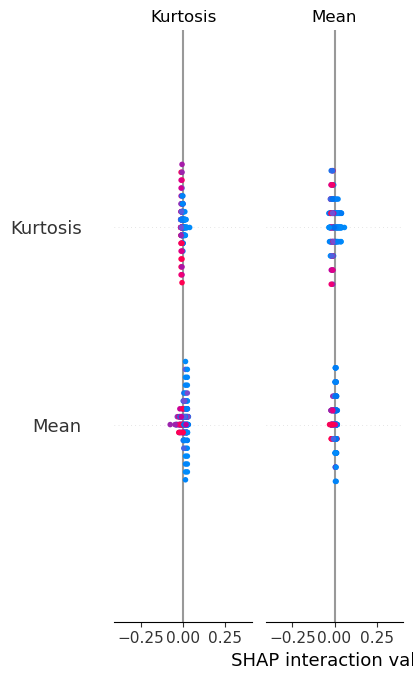

In [1]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Define RandomForestClassifier model
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train)

# Initialize the SHAP explainer with the trained RandomForest model and testing data
explainer = shap.TreeExplainer(model)

# Calculate SHAP values for all samples in the testing data
shap_values = explainer.shap_values(X_test)

# Visualize the explanations
shap.summary_plot(shap_values, X_test)


C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\Hp\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


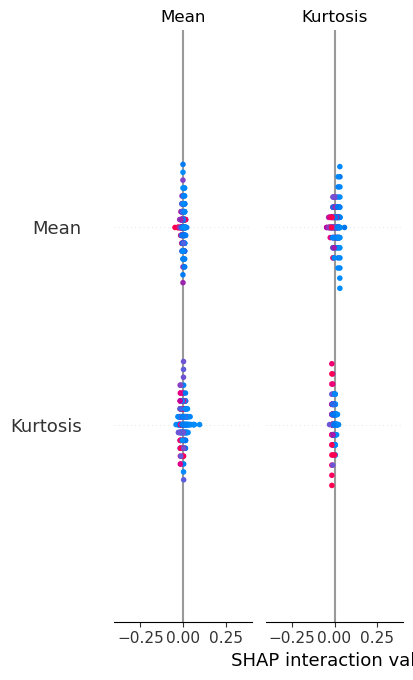

In [2]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
import shap

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Define RandomForestClassifier model
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train)

# Initialize the SHAP explainer with the trained RandomForest model and testing data
explainer = shap.TreeExplainer(model)

# Calculate SHAP values for all samples in the testing data
shap_values = explainer.shap_values(X_test)

# Visualize the explanations
shap.summary_plot(shap_values, X_test)


In [1]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import lime
import lime.lime_tabular

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define RandomForestClassifier model
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode="classification", feature_names=X_train.columns)

# Choose a sample from the testing data
sample_idx = 0

# Explain the prediction for the selected sample
exp = explainer.explain_instance(X_test.iloc[sample_idx].values, model.predict_proba, num_features=len(X_test.columns))

# Display the explanation
exp.show_in_notebook()


Accuracy: 0.9732620320855615
               precision    recall  f1-score   support

    Depressed       0.98      0.97      0.97        91
Non Depressed       0.97      0.98      0.97        96

     accuracy                           0.97       187
    macro avg       0.97      0.97      0.97       187
 weighted avg       0.97      0.97      0.97       187



C:\Users\Hp\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import shap
import matplotlib.pyplot as plt

# Load the training datasets for DP and NDP
train_dp = pd.read_csv(r'G:\DataSet\train\trainDP.csv')
train_ndp = pd.read_csv(r'G:\DataSet\train\trainNDP.csv')

# Load the testing datasets for DP and NDP
test_dp = pd.read_csv(r'G:\DataSet\test\testDP.csv')
test_ndp = pd.read_csv(r'G:\DataSet\test\testNDP.csv')

# Combine DP and NDP datasets for training and testing
train_data = pd.concat([train_dp, train_ndp], ignore_index=True)
test_data = pd.concat([test_dp, test_ndp], ignore_index=True)

# Drop problematic columns
train_data = train_data.drop(columns=['FFT', 'Power spectral density'])
test_data = test_data.drop(columns=['FFT', 'Power spectral density'])

# Separate features and target variable for training data
X_train = train_data.drop(columns=['Class'])
y_train = train_data['Class']

# Separate features and target variable for testing data
X_test = test_data.drop(columns=['Class'])
y_test = test_data['Class']

# Encode target variable into numerical labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Define Random Forest model
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train_encoded)

# Make predictions on the testing data
y_pred_encoded = model.predict(X_test)

# Decode the predicted labels back to original string representations
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Generate classification report
report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
print(report)

# Initialize the explainer with the RandomForest model and training data
explainer = shap.TreeExplainer(model)
# Calculate SHAP values for all samples in the testing data
shap_values = explainer.shap_values(X_test)
# Visualize the explanations
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.savefig('shap_summary_plot.png', bbox_inches='tight', dpi=300)
plt.show()
